In [38]:
import numpy as np
import pandas as pd
import torch

import matplotlib.pyplot as plt
import os
import glob
import cv2
import netCDF4 as nc
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [39]:
base_path = 'D:/data/date_kst_URP/20200101/'

search_path = os.path.join(base_path, '16ch_*.npy')
file_list = sorted(glob.glob(search_path))

print(f'search path: {search_path}')
print(f'# of files: {len(file_list)}')

search path: D:/data/date_kst_URP/20200101/16ch_*.npy
# of files: 8


In [40]:
file_list

['D:/data/date_kst_URP/20200101\\16ch_202001010000.npy',
 'D:/data/date_kst_URP/20200101\\16ch_202001010300.npy',
 'D:/data/date_kst_URP/20200101\\16ch_202001010600.npy',
 'D:/data/date_kst_URP/20200101\\16ch_202001010900.npy',
 'D:/data/date_kst_URP/20200101\\16ch_202001011200.npy',
 'D:/data/date_kst_URP/20200101\\16ch_202001011500.npy',
 'D:/data/date_kst_URP/20200101\\16ch_202001011800.npy',
 'D:/data/date_kst_URP/20200101\\16ch_202001012100.npy']

[1] 16ch_202001010000.npy
Shape: (16, 512, 512) | DType: float16
Min: 17.0 | Max: 16296.0 | Mean: 4066.0

[2] 16ch_202001010300.npy
Shape: (16, 512, 512) | DType: float16
Min: 17.0 | Max: 16296.0 | Mean: 4080.0

[3] 16ch_202001010600.npy
Shape: (16, 512, 512) | DType: float16
Min: 17.0 | Max: 16320.0 | Mean: 4096.0

[4] 16ch_202001010900.npy
Shape: (16, 512, 512) | DType: float16
Min: 22.0 | Max: 16288.0 | Mean: 4132.0

[5] 16ch_202001011200.npy
Shape: (16, 512, 512) | DType: float16
Min: 0.0 | Max: 16208.0 | Mean: 4168.0

[6] 16ch_202001011500.npy
Shape: (16, 512, 512) | DType: float16
Min: 0.0 | Max: 16224.0 | Mean: 4100.0

[7] 16ch_202001011800.npy
Shape: (16, 512, 512) | DType: float16
Min: 17.0 | Max: 16272.0 | Mean: 3980.0

[8] 16ch_202001012100.npy
Shape: (16, 512, 512) | DType: float16
Min: 17.0 | Max: 16280.0 | Mean: 3980.0



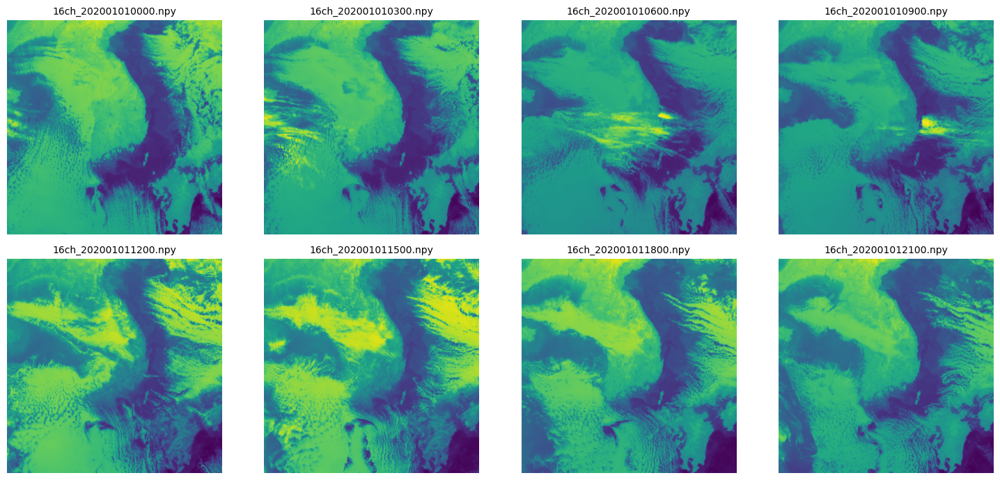

In [41]:
n_files = len(file_list)
cols = 4
rows = (n_files + cols  - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(15, 3.5 * rows))
axes = axes.flatten()

for i, file_path in enumerate(file_list):
    data = np.load(file_path)
    file_name = os.path.basename(file_path)

    print(f"[{i+1}] {file_name}")
    print(f"Shape: {data.shape} | DType: {data.dtype}")
    print(f"Min: {np.min(data)} | Max: {np.max(data)} | Mean: {np.mean(data)}")
    print()

    img = data[12, :, :]

    axes[i].imshow(img, cmap='viridis')
    axes[i].set_title(file_name, fontsize=10)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

File: 16ch_202001010000.npy
Shape: (16, 512, 512) | DType: float16
Min: 17.0000 | Max: 16296.0000 | Mean: 4066.0000



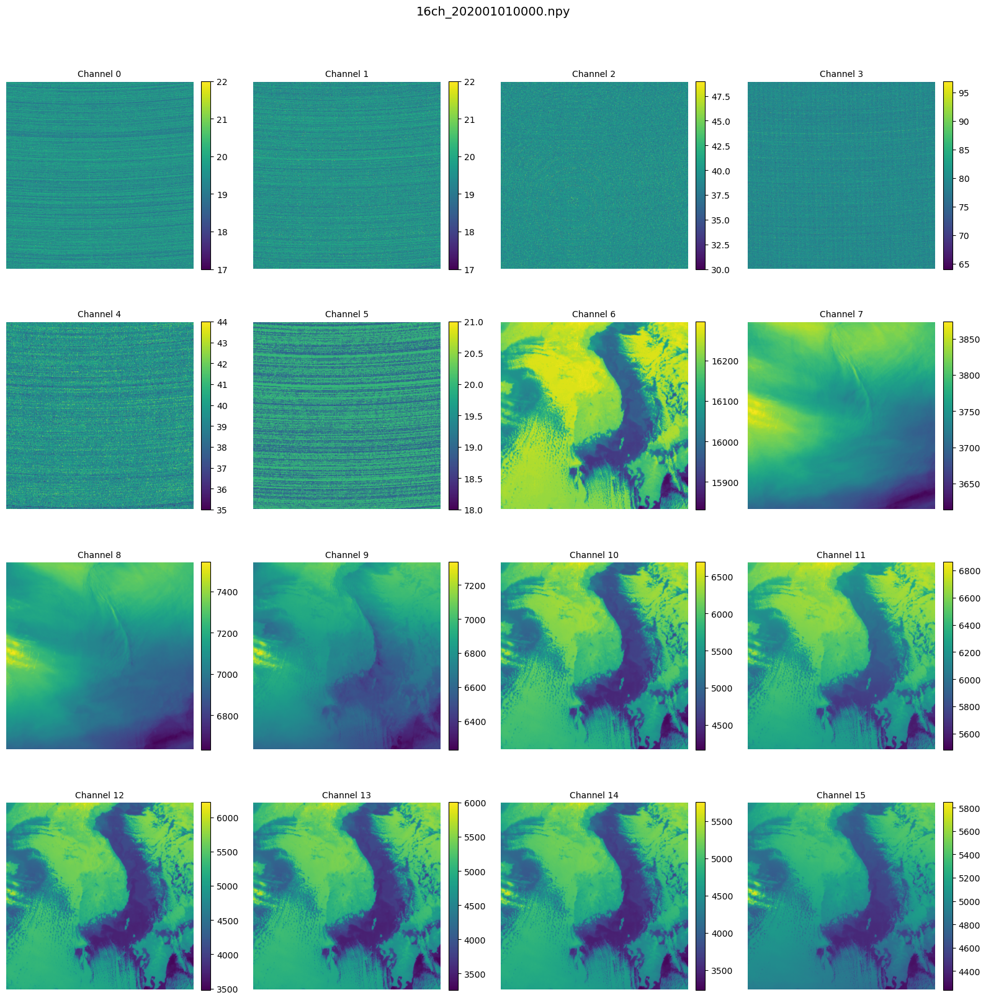

In [42]:
def visualize_16_channels(file_path, cmap='viridis', figsize=(16, 16)):
    """
    단일 npy 파일의 16채널을 각각 시각화하는 함수
    
    Parameters:
    -----------
    file_path : str
        npy 파일 경로 (shape: 16, 512, 512)
    cmap : str
        colormap 이름 (default: 'viridis')
    figsize : tuple
        figure 크기 (default: (16, 16))
    """
    data = np.load(file_path)
    file_name = os.path.basename(file_path)
    
    print(f"File: {file_name}")
    print(f"Shape: {data.shape} | DType: {data.dtype}")
    print(f"Min: {np.min(data):.4f} | Max: {np.max(data):.4f} | Mean: {np.mean(data):.4f}")
    print()
    
    fig, axes = plt.subplots(4, 4, figsize=figsize)
    axes = axes.flatten()
    
    for ch in range(16):
        img = data[ch, :, :]
        im = axes[ch].imshow(img, cmap=cmap)
        axes[ch].set_title(f'Channel {ch}', fontsize=10)
        axes[ch].axis('off')
        plt.colorbar(im, ax=axes[ch], fraction=0.046, pad=0.04)
    
    plt.suptitle(file_name, fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()


# 사용 예시: 첫 번째 파일의 16채널 시각화
visualize_16_channels(file_list[0])

In [44]:
# Cartopy 프로젝션 및 위도/경도 설정
lat_lon_path = 'assets/gk2a_ami_ko010lc_latlon.nc'
origin_size = 900  # 2km 해상도

# 위도/경도 데이터 로드
lat_lon_data = nc.Dataset(lat_lon_path)
lat_full = lat_lon_data['lat'][:].data
lon_full = lat_lon_data['lon'][:].data

# 원본 크기로 리사이즈
lat_full = cv2.resize(lat_full, (origin_size, origin_size), interpolation=cv2.INTER_CUBIC)
lon_full = cv2.resize(lon_full, (origin_size, origin_size), interpolation=cv2.INTER_CUBIC)

# Cartopy 프로젝션 설정
lcc = ccrs.LambertConformal(central_longitude=126, central_latitude=38, standard_parallels=(30, 60))
proj = ccrs.PlateCarree()

print(f"lat shape: {lat_full.shape}, lon shape: {lon_full.shape}")
print(f"lat range: {lat_full.min():.2f} ~ {lat_full.max():.2f}")
print(f"lon range: {lon_full.min():.2f} ~ {lon_full.max():.2f}")

lat shape: (900, 900), lon shape: (900, 900)
lat range: 29.31 ~ 46.36
lon range: 114.00 ~ 138.00


In [45]:
# 16채널 npy 파일의 좌표 계산
# 파일이 512x512이고 900x900 원본에서 crop된 경우
# get_crop_base 함수 참고: x_base = (900-512)/2 + 75, y_base = (900-512)/2 + 115

image_size = 512
x_base = int((900 - 512) / 2 + 75)   # 269
y_base = int((900 - 512) / 2 + 115)  # 309

# 512x512 영역에 해당하는 위도/경도 추출
lat_512 = lat_full[y_base:y_base+image_size, x_base:x_base+image_size]
lon_512 = lon_full[y_base:y_base+image_size, x_base:x_base+image_size]

print(f"512x512 영역 좌표: x={x_base}:{x_base+image_size}, y={y_base}:{y_base+image_size}")
print(f"lat_512 shape: {lat_512.shape}")
print(f"lat range: {lat_512.min():.2f} ~ {lat_512.max():.2f}")
print(f"lon range: {lon_512.min():.2f} ~ {lon_512.max():.2f}")

512x512 영역 좌표: x=269:781, y=309:821
lat_512 shape: (512, 512)
lat range: 30.95 ~ 40.60
lon range: 121.60 ~ 134.03


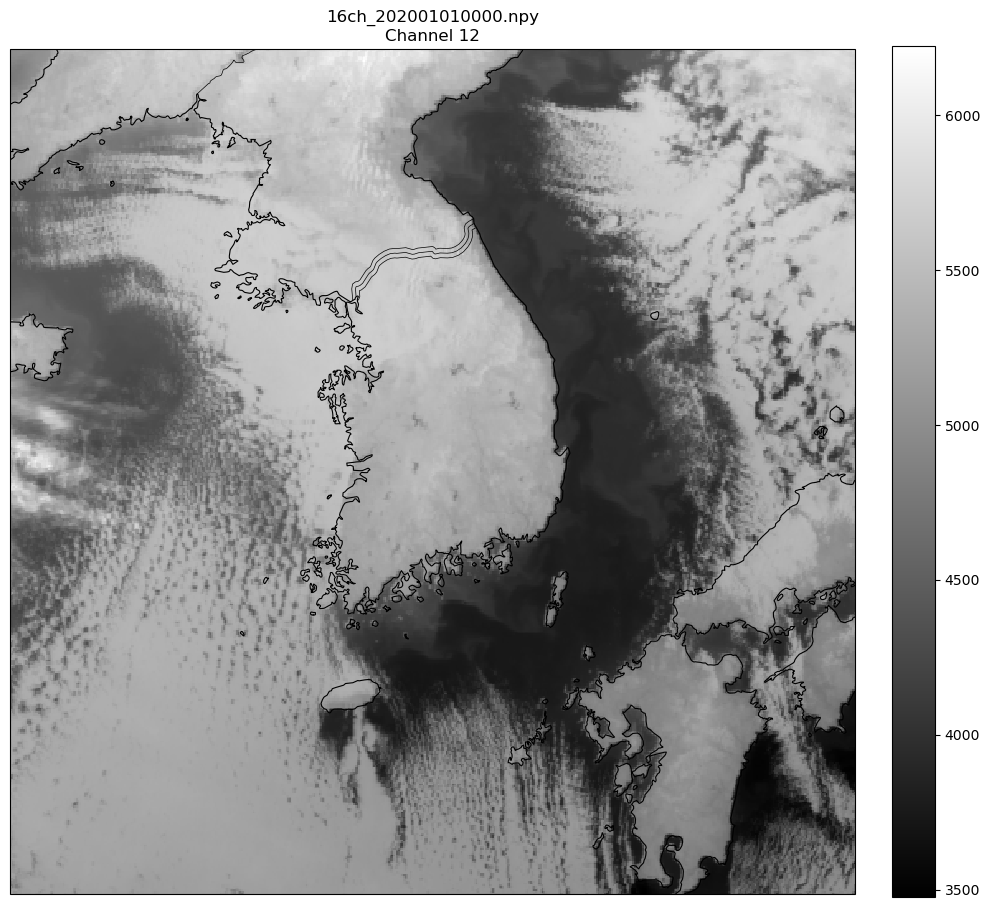

In [46]:
def visualize_with_map(file_path, channel=None, cmap='viridis', figsize=(10, 10)):
    """
    Cartopy를 사용하여 한반도 해안선/국경과 함께 위성 이미지 시각화
    
    Parameters:
    -----------
    file_path : str
        npy 파일 경로 (shape: 16, 512, 512)
    channel : int or None
        특정 채널만 보기 (None이면 평균)
    cmap : str
        colormap (default: 'viridis')
    figsize : tuple
        figure 크기
    """
    data = np.load(file_path).astype(np.float64)
    file_name = os.path.basename(file_path)
    
    # 채널 선택
    if channel is not None:
        img = data[channel, :, :]
        ch_info = f'Channel {channel}'
    else:
        img = np.mean(data, axis=0)
        ch_info = 'Mean of 16 channels'
    
    fig, ax = plt.subplots(figsize=figsize, subplot_kw={'projection': lcc})
    
    # 위성 이미지 표시 (위도/경도 좌표 사용)
    im = ax.pcolormesh(lon_512, lat_512, img, cmap=cmap, transform=proj)
    
    # 해안선 및 국경 추가
    ax.coastlines(resolution='10m', color='black', linewidth=0.8)
    ax.add_feature(cfeature.BORDERS.with_scale('10m'), edgecolor='black', linewidth=0.5)
    
    # 컬러바
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    
    ax.set_title(f'{file_name}\n{ch_info}', fontsize=12)
    plt.tight_layout()
    plt.show()


# 사용 예시
visualize_with_map(file_list[0], channel=12, cmap='gray')

File: 16ch_202001010000.npy
Shape: (16, 512, 512) | DType: float64


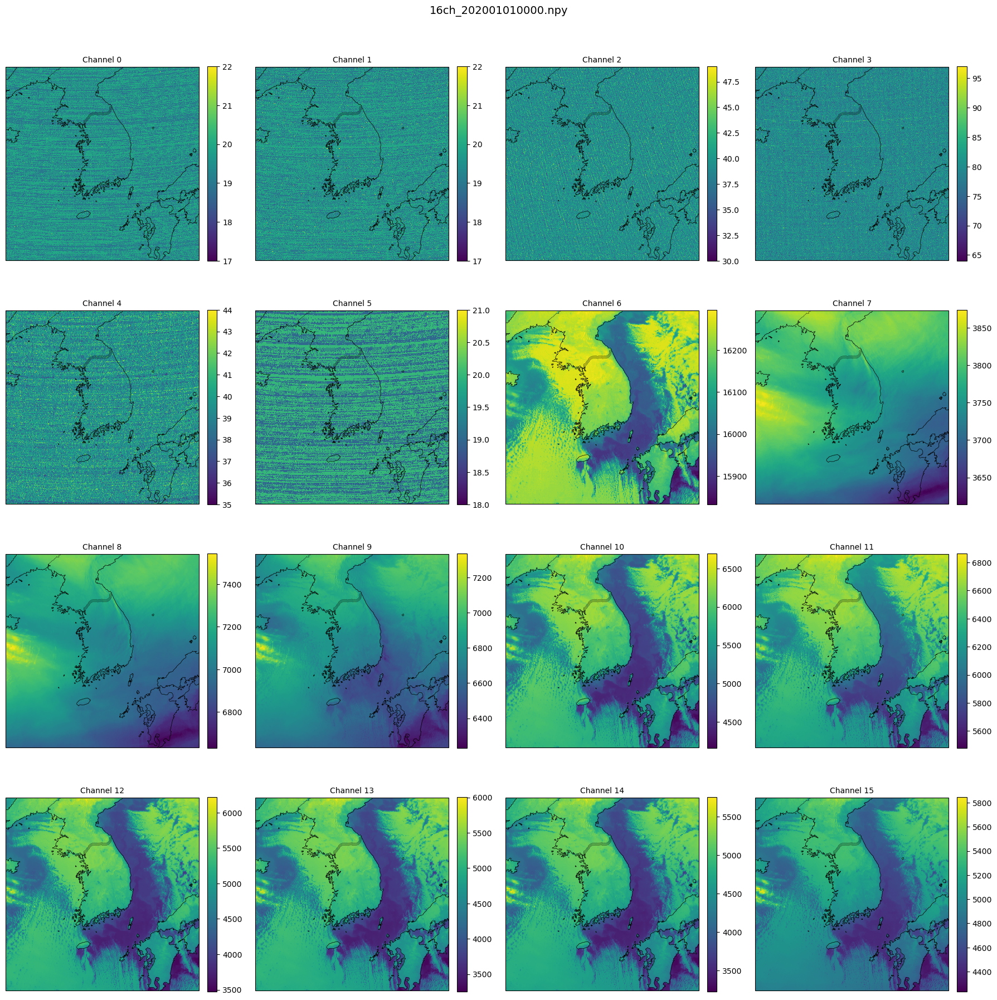

In [47]:
def visualize_16_channels_with_map(file_path, cmap='viridis', figsize=(18, 18)):
    """
    16채널 모두를 Cartopy 지도와 함께 시각화
    
    Parameters:
    -----------
    file_path : str
        npy 파일 경로 (shape: 16, 512, 512)
    cmap : str
        colormap (default: 'viridis')
    figsize : tuple
        figure 크기
    """
    data = np.load(file_path).astype(np.float64)
    file_name = os.path.basename(file_path)
    
    print(f"File: {file_name}")
    print(f"Shape: {data.shape} | DType: {data.dtype}")
    
    fig, axes = plt.subplots(4, 4, figsize=figsize, subplot_kw={'projection': lcc})
    axes = axes.flatten()
    
    for ch in range(16):
        ax = axes[ch]
        img = data[ch, :, :]
        
        im = ax.pcolormesh(lon_512, lat_512, img, cmap=cmap, transform=proj)
        ax.coastlines(resolution='10m', color='black', linewidth=0.5)
        ax.add_feature(cfeature.BORDERS.with_scale('10m'), edgecolor='black', linewidth=0.3)
        ax.set_title(f'Channel {ch}', fontsize=10)
        
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    
    plt.suptitle(file_name, fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()


# 사용 예시
visualize_16_channels_with_map(file_list[0], cmap='viridis')

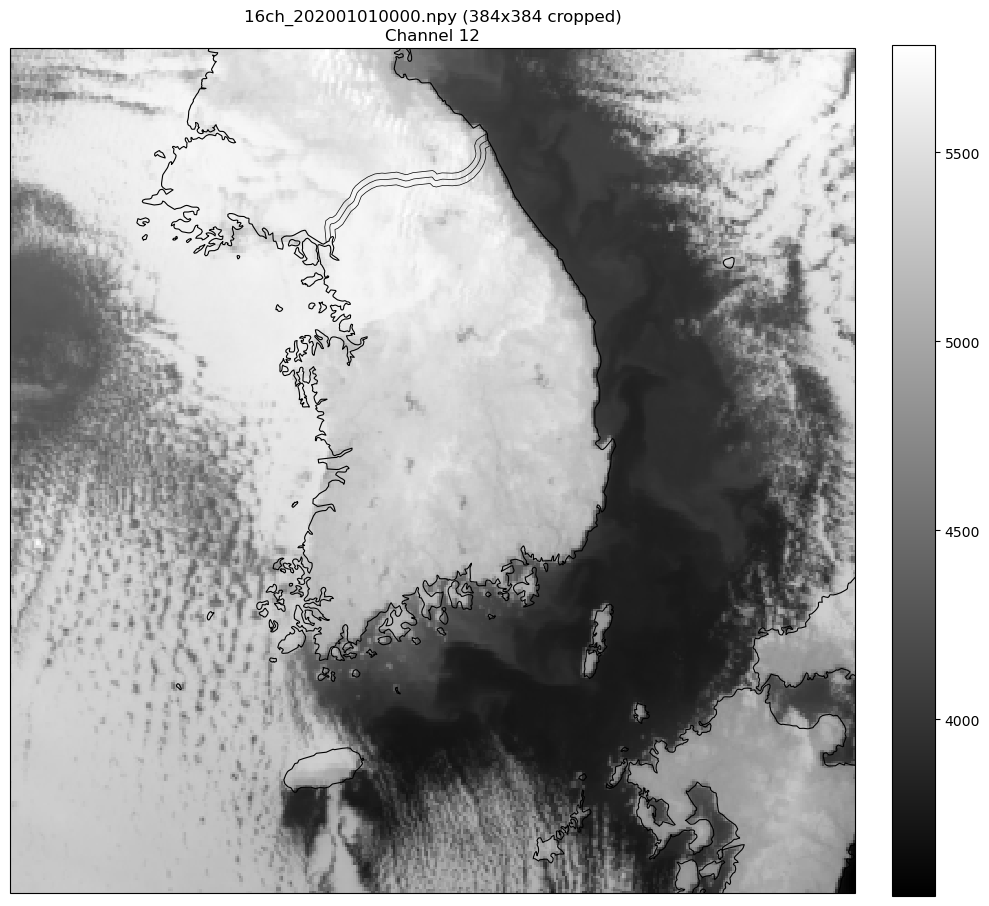

In [ ]:
# 384x384 crop 설정
# 512x512에서 384x384로 crop할 때, 한반도가 중앙에 오도록 좌표 설정
# 512 - 384 = 128, 따라서 start는 0~128 범위

crop_size = 384
crop_start_y = 64  # 상하 중앙
crop_start_x = 64  # 좌우 중앙

# 384x384 영역에 해당하는 위도/경도 추출
lat_384 = lat_512[crop_start_y:crop_start_y+crop_size, crop_start_x:crop_start_x+crop_size]
lon_384 = lon_512[crop_start_y:crop_start_y+crop_size, crop_start_x:crop_start_x+crop_size]

print(f"384x384 crop 좌표 (512 기준): y={crop_start_y}:{crop_start_y+crop_size}, x={crop_start_x}:{crop_start_x+crop_size}")
print(f"lat_384 shape: {lat_384.shape}")
print(f"lat range: {lat_384.min():.2f} ~ {lat_384.max():.2f}")
print(f"lon range: {lon_384.min():.2f} ~ {lon_384.max():.2f}")

def visualize_cropped_with_map(file_path, channel=None, cmap='viridis', figsize=(10, 10)):
    """
    384x384로 crop된 이미지를 Cartopy 지도와 함께 시각화
    
    Parameters:
    -----------
    file_path : str
        npy 파일 경로 (shape: 16, 512, 512)
    channel : int or None
        특정 채널만 보기 (None이면 평균)
    cmap : str
        colormap (default: 'viridis')
    figsize : tuple
        figure 크기
    """
    data = np.load(file_path).astype(np.float64)
    file_name = os.path.basename(file_path)
    
    # 384x384로 crop
    data_cropped = data[:, crop_start_y:crop_start_y+crop_size, crop_start_x:crop_start_x+crop_size]
    
    # 채널 선택
    if channel is not None:
        img = data_cropped[channel, :, :]
        ch_info = f'Channel {channel}'
    else:
        img = np.mean(data_cropped, axis=0)
        ch_info = 'Mean of 16 channels'
    
    fig, ax = plt.subplots(figsize=figsize, subplot_kw={'projection': lcc})
    
    # 위성 이미지 표시
    im = ax.pcolormesh(lon_384, lat_384, img, cmap=cmap, transform=proj)
    
    # 해안선 및 국경 추가
    ax.coastlines(resolution='10m', color='black', linewidth=0.8)
    ax.add_feature(cfeature.BORDERS.with_scale('10m'), edgecolor='black', linewidth=0.5)
    
    # 컬러바
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    
    ax.set_title(f'{file_name} (384x384 cropped)\n{ch_info}', fontsize=12)
    plt.tight_layout()
    plt.show()


# 사용 예시
visualize_cropped_with_map(file_list[0], channel=12, cmap='gray')

Land stations: [93, 108, 112, 119, 131, 133, 136, 143, 146, 156, 177]
Coast stations: [102, 104, 115, 138, 152, 155, 159, 165, 168, 169, 184, 189]


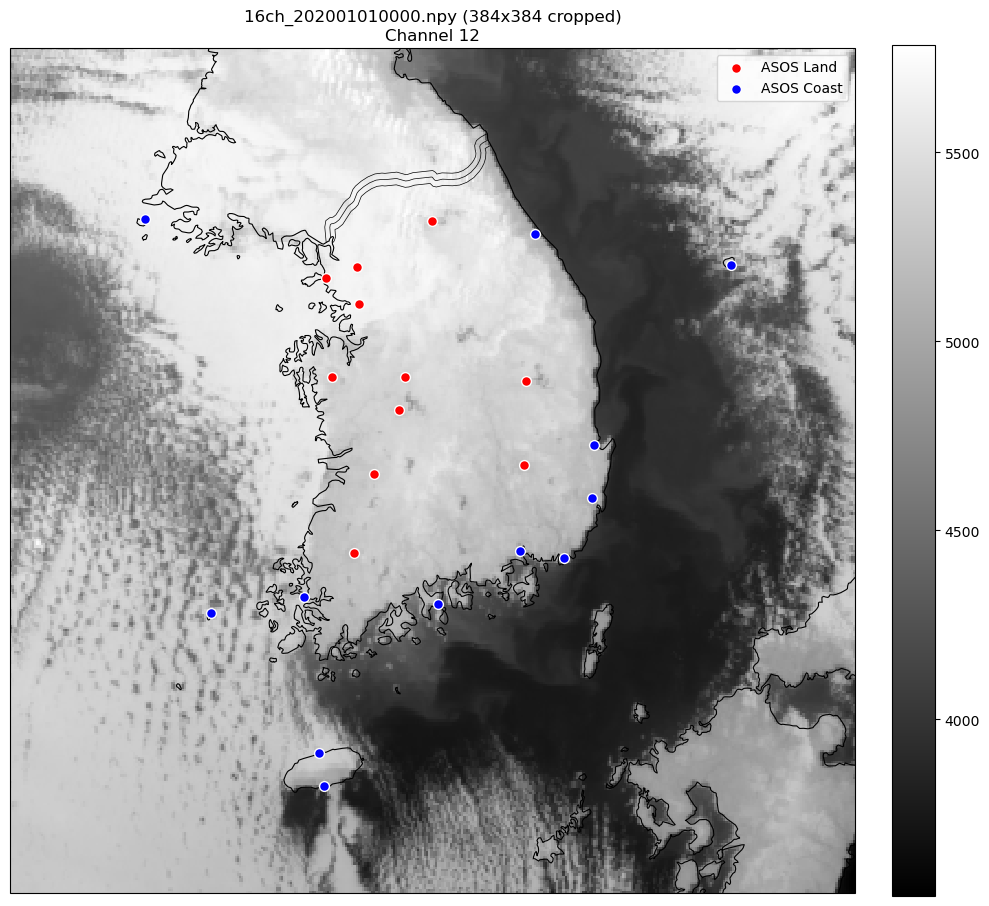

In [69]:
# ASOS 관측소 좌표 정의 (utils.py에서 가져옴)
from utils import ASOS_LAND_COORD, ASOS_COAST_COORD, coord_to_map, get_crop_base

# 512x512 이미지 기준 관측소 좌표 계산
origin_size = 900
image_size = 512

# asos 영역의 base 좌표 계산
asos_x_base, asos_y_base, asos_image_size = get_crop_base(image_size, label_type='asos')

# 관측소 좌표를 512x512 이미지 좌표로 변환
asos_land_map = {k: coord_to_map(*v, origin_size) for k, v in ASOS_LAND_COORD.items()}
asos_land_map = {k: (v[0]-asos_x_base, v[1]-asos_y_base) for k, v in asos_land_map.items()}

asos_coast_map = {k: coord_to_map(*v, origin_size) for k, v in ASOS_COAST_COORD.items()}
asos_coast_map = {k: (v[0]-asos_x_base, v[1]-asos_y_base) for k, v in asos_coast_map.items()}

print(f"Land stations: {list(asos_land_map.keys())}")
print(f"Coast stations: {list(asos_coast_map.keys())}")

def visualize_cropped_with_stations(file_path, channel=None, cmap='viridis', figsize=(10, 10)):
    """
    384x384로 crop된 이미지에 ASOS 관측소 위치를 Land/Coast로 구분하여 시각화
    """
    data = np.load(file_path).astype(np.float64)
    file_name = os.path.basename(file_path)
    
    # 384x384로 crop (이미 정의된 crop_start_x, crop_start_y, crop_size 사용)
    data_cropped = data[:, crop_start_y:crop_start_y+crop_size, crop_start_x:crop_start_x+crop_size]
    
    # 채널 선택
    if channel is not None:
        img = data_cropped[channel, :, :]
        ch_info = f'Channel {channel}'
    else:
        img = np.mean(data_cropped, axis=0)
        ch_info = 'Mean of 16 channels'
    
    fig, ax = plt.subplots(figsize=figsize, subplot_kw={'projection': lcc})
    
    # 위성 이미지 표시 (이미 정의된 lat_384, lon_384 사용)
    im = ax.pcolormesh(lon_384, lat_384, img, cmap=cmap, transform=proj)
    
    # 해안선 및 국경 추가
    ax.coastlines(resolution='10m', color='black', linewidth=0.8)
    ax.add_feature(cfeature.BORDERS.with_scale('10m'), edgecolor='black', linewidth=0.5)
    
    # 관측소 좌표를 384x384 기준으로 변환하여 표시
    for k, v in asos_land_map.items():
        x_384 = v[0] - crop_start_x
        y_384 = v[1] - crop_start_y
        if 0 <= x_384 < crop_size and 0 <= y_384 < crop_size:
            station_lon = lon_384[int(y_384), int(x_384)]
            station_lat = lat_384[int(y_384), int(x_384)]
            ax.scatter(station_lon, station_lat, c='red', marker='o', s=50, 
                      edgecolors='white', linewidths=1, transform=proj, zorder=5)
    
    for k, v in asos_coast_map.items():
        x_384 = v[0] - crop_start_x
        y_384 = v[1] - crop_start_y
        if 0 <= x_384 < crop_size and 0 <= y_384 < crop_size:
            station_lon = lon_384[int(y_384), int(x_384)]
            station_lat = lat_384[int(y_384), int(x_384)]
            ax.scatter(station_lon, station_lat, c='blue', marker='o', s=50, 
                      edgecolors='white', linewidths=1, transform=proj, zorder=5)
    
    # 범례
    ax.scatter([], [], c='red', marker='o', s=50, edgecolors='white', label='ASOS Land')
    ax.scatter([], [], c='blue', marker='o', s=50, edgecolors='white', label='ASOS Coast')
    
    # 컬러바
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    
    ax.set_title(f'{file_name} (384x384 cropped)\n{ch_info}', fontsize=12)
    ax.legend(loc='upper right')
    plt.tight_layout()
    plt.show()


# 사용 예시
visualize_cropped_with_stations(file_list[0], channel=12, cmap='gray')

File: 16ch_202001010000.npy
Original shape: (16, 512, 512) -> Cropped shape: (16, 384, 384)


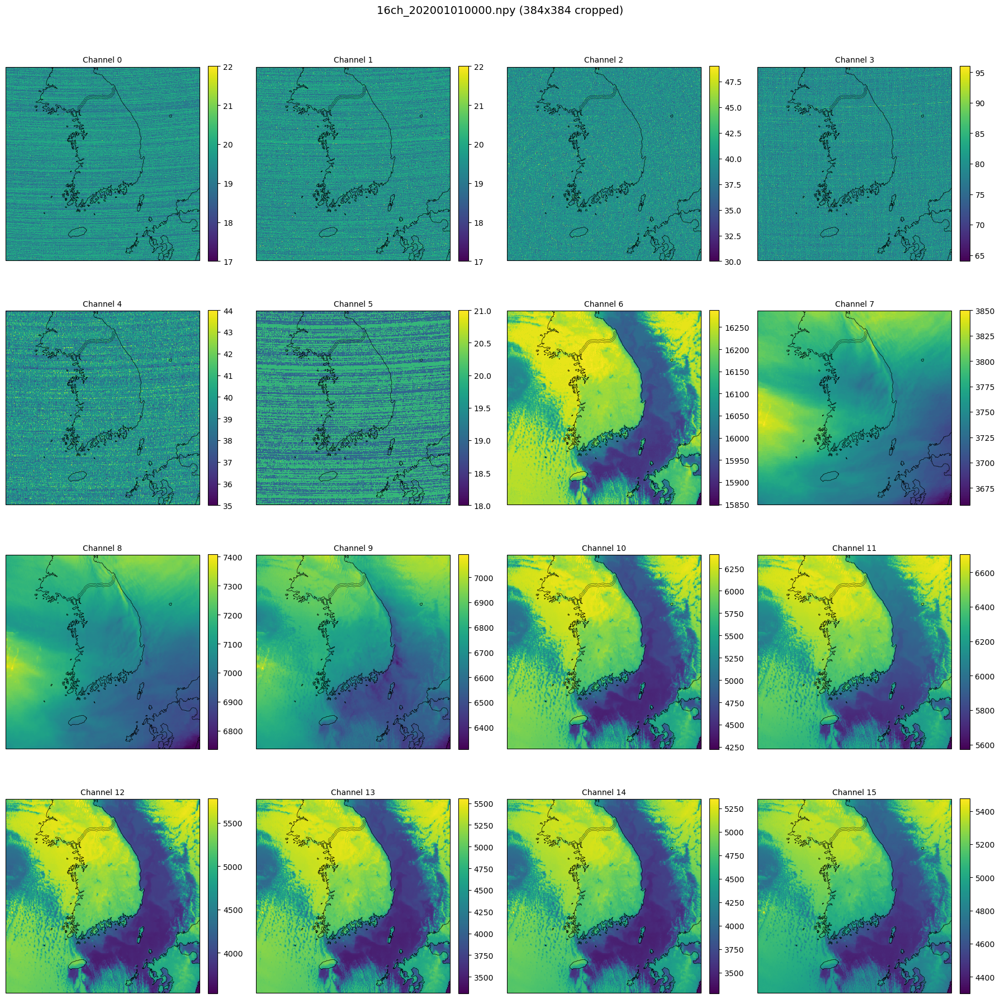

In [52]:
def visualize_16_channels_cropped_with_map(file_path, cmap='viridis', figsize=(18, 18)):
    """
    384x384로 crop된 16채널 모두를 Cartopy 지도와 함께 시각화
    
    Parameters:
    -----------
    file_path : str
        npy 파일 경로 (shape: 16, 512, 512)
    cmap : str
        colormap (default: 'viridis')
    figsize : tuple
        figure 크기
    """
    data = np.load(file_path).astype(np.float64)
    file_name = os.path.basename(file_path)
    
    # 384x384로 crop
    data_cropped = data[:, crop_start_y:crop_start_y+crop_size, crop_start_x:crop_start_x+crop_size]
    
    print(f"File: {file_name}")
    print(f"Original shape: {data.shape} -> Cropped shape: {data_cropped.shape}")
    
    fig, axes = plt.subplots(4, 4, figsize=figsize, subplot_kw={'projection': lcc})
    axes = axes.flatten()
    
    for ch in range(16):
        ax = axes[ch]
        img = data_cropped[ch, :, :]
        
        im = ax.pcolormesh(lon_384, lat_384, img, cmap=cmap, transform=proj)
        ax.coastlines(resolution='10m', color='black', linewidth=0.5)
        ax.add_feature(cfeature.BORDERS.with_scale('10m'), edgecolor='black', linewidth=0.3)
        ax.set_title(f'Channel {ch}', fontsize=10)
        
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    
    plt.suptitle(f'{file_name} (384x384 cropped)', fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()


# 사용 예시
visualize_16_channels_cropped_with_map(file_list[0], cmap='viridis')